In [ ]:
import cv2
import skimage
import skimage.filters
import skimage.restoration
import scipy
import scipy.ndimage
import scipy.signal
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from math import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Исходное изображение до наложения шума
image = cv2.cvtColor(cv2.imread("/content/drive/MyDrive/lr3/itmo.jpg"), cv2.COLOR_BGR2GRAY)
print(image.shape)

images_noised = {}

# Общая для всех зашумлённость
amount = 0.2
var = 0.1
mean = 0.0
lam = 12.0

(800, 1200)


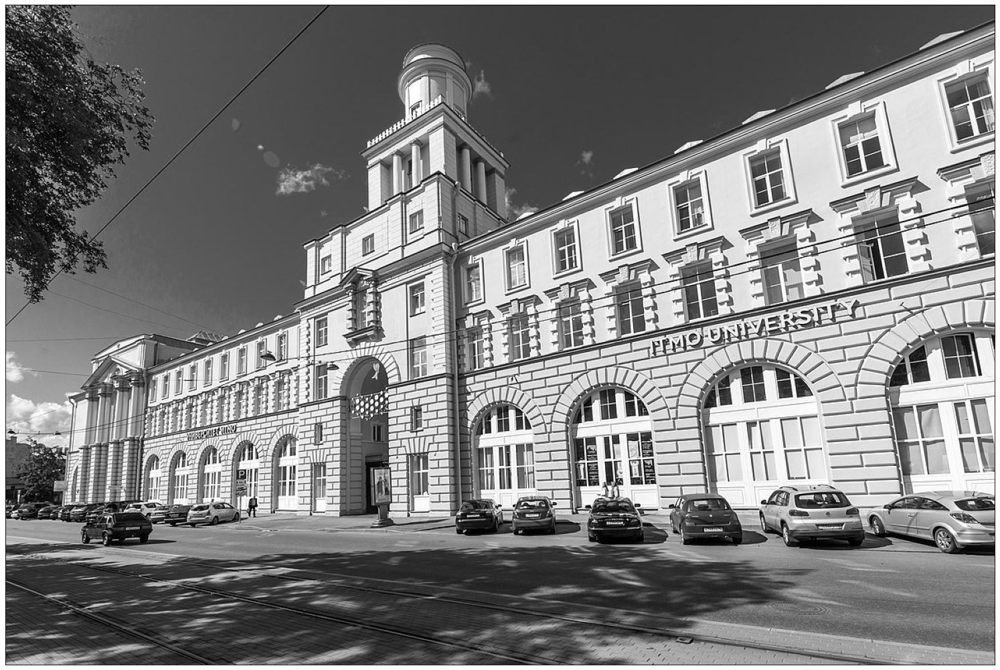

In [ ]:
# Исходное изображение до наложения шума
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 3 Нелинейная фильтрация.

Низкочастотные фильтры линейны и оптимальны в случае, когда имеет место нормальное распределение помех на цифровом
изображении. Линейные фильтры локально усредняют импульсные
помехи, сглаживая изображения. Для устранения импульсных помех лучше использовать нелинейные, например, медианные фильтры.

### 3.1 Медианный фильтр

[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


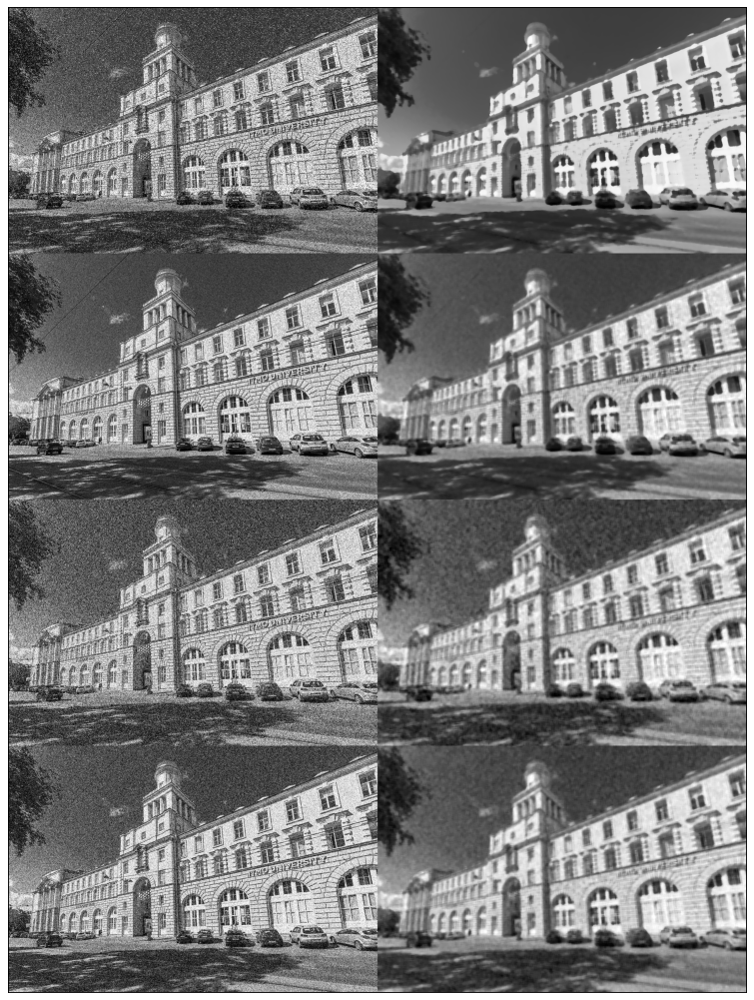

In [ ]:
kernel = np.ones((11,11),np.float64)
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.median_filter(images_noised[image_name], footprint=kernel)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 3.2 Взвешенный медианный фильтр

[[0.99549803 0.51410994 0.33164021 0.6549634  0.62653881 0.82316881
  0.65286583 0.62394536 0.16999968 0.29302372 0.38229314]
 [0.8247794  0.60636365 0.01926185 0.20556227 0.72453997 0.82377964
  0.28722049 0.49674373 0.00688416 0.26942213 0.55753118]
 [0.25755155 0.65750544 0.06334439 0.83048139 0.47789571 0.02922572
  0.75093769 0.56583005 0.97721165 0.38705749 0.9839541 ]
 [0.56868918 0.96205314 0.56284714 0.85063451 0.5174499  0.04482381
  0.38210705 0.43599994 0.69025685 0.54613528 0.72223594]
 [0.7075401  0.33686655 0.1315005  0.21149678 0.76718655 0.81736372
  0.97842414 0.79373205 0.79570782 0.75020679 0.47583494]
 [0.1997479  0.68378222 0.34611484 0.13618248 0.49916887 0.64776658
  0.6698796  0.45849656 0.15203917 0.85713161 0.15220141]
 [0.86698378 0.3886691  0.84217592 0.88604178 0.68281063 0.38422419
  0.74080598 0.72975083 0.26019347 0.70035988 0.66461307]
 [0.24704469 0.46116534 0.9009405  0.55040896 0.69517356 0.97370828
  0.41687786 0.58476811 0.03971926 0.48651751 0.11

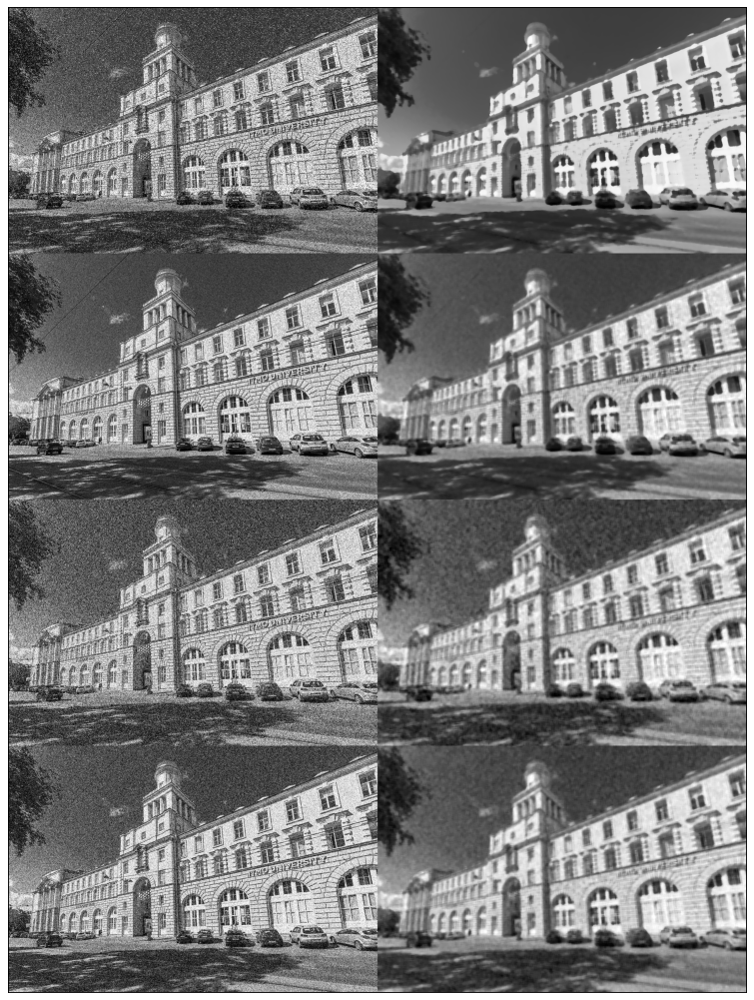

In [ ]:
kernel = np.random.random(size=(11,11))
kernel /= np.max(kernel)
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.median_filter(images_noised[image_name], footprint=kernel)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 3.3 Ранговый фильтр

rank = 0
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


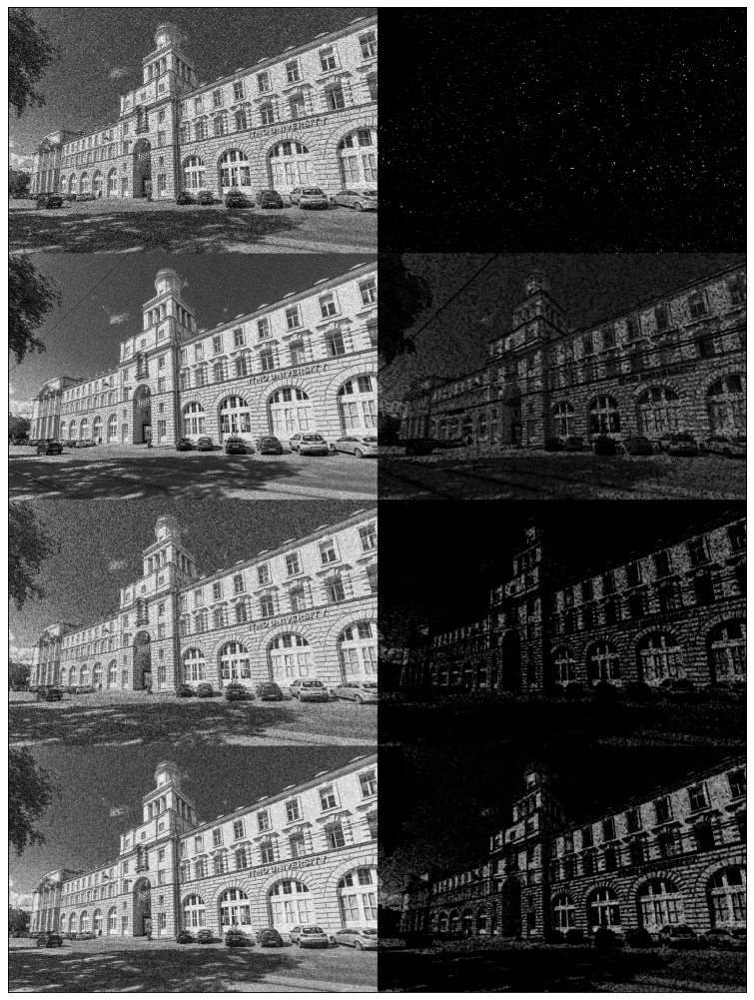

In [ ]:
rank = -25
kernel = np.ones((5,5),np.float64)
print(f"rank = {rank + 25}")
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.rank_filter(images_noised[image_name], footprint=kernel, rank=rank)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

rank = 7
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


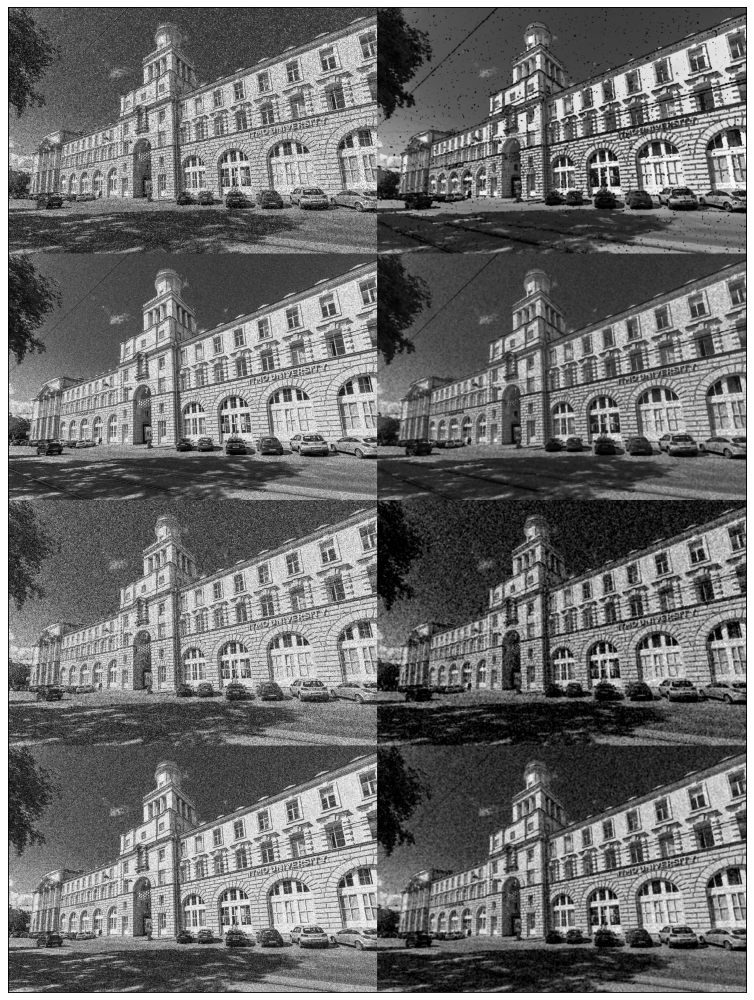

In [ ]:
rank = -18
kernel = np.ones((5,5),np.float64)
print(f"rank = {rank + 25}")
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.rank_filter(images_noised[image_name], footprint=kernel, rank=rank)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

rank = 13
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


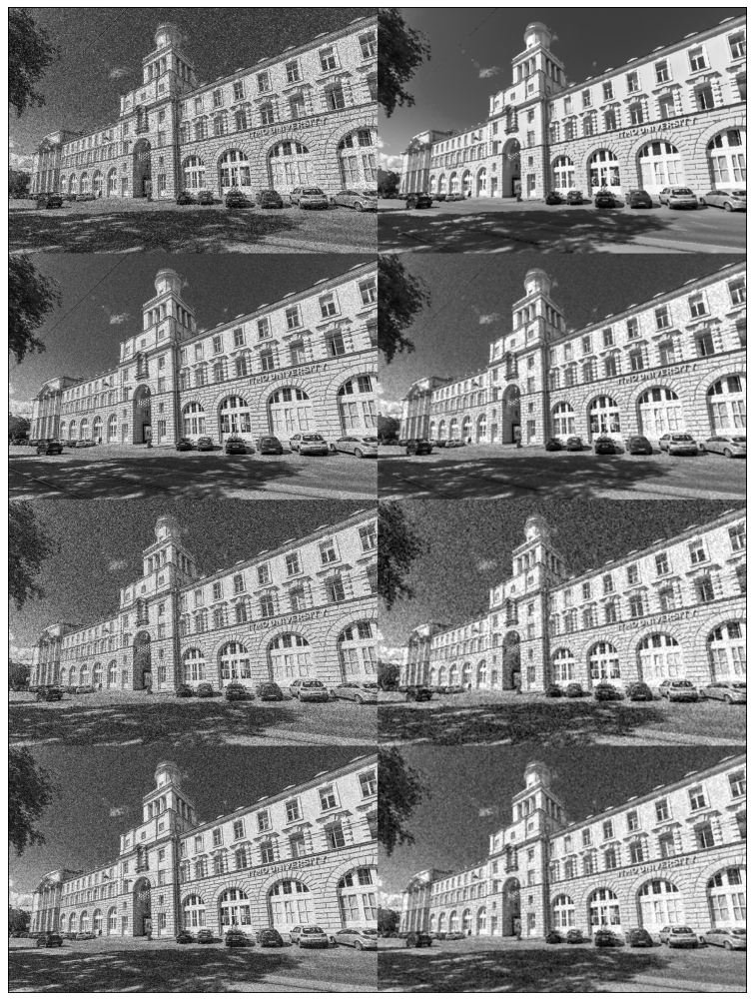

In [ ]:
rank = -12
kernel = np.ones((5,5),np.float64)
print(f"rank = {rank + 25}")
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.rank_filter(images_noised[image_name], footprint=kernel, rank=rank)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

rank = 19
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


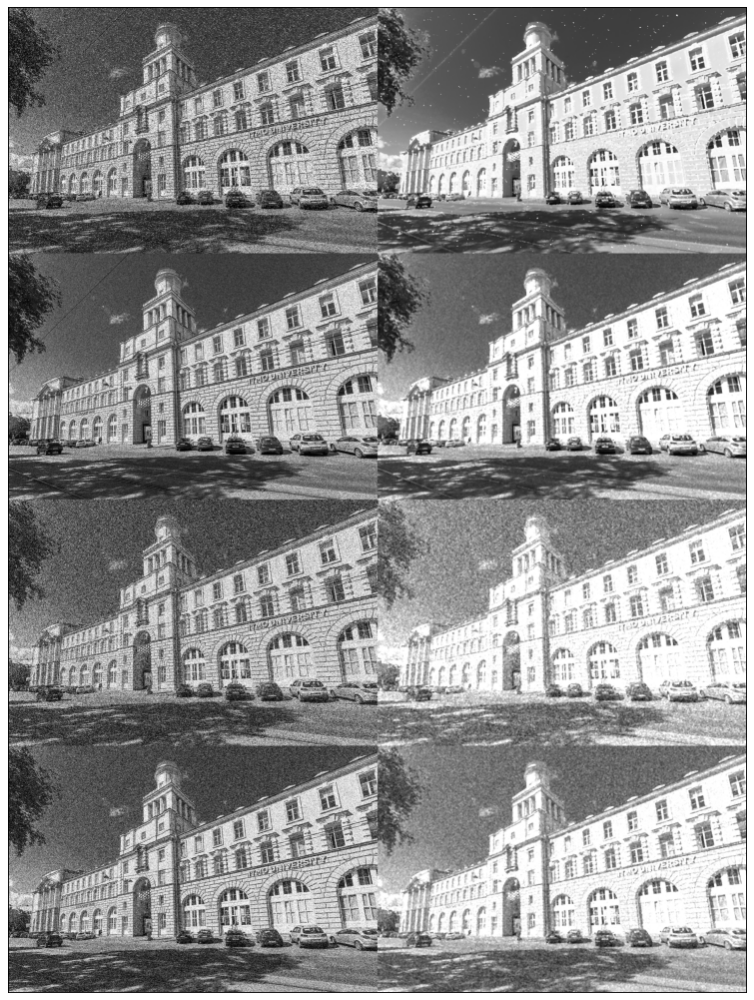

In [ ]:
rank = -6
kernel = np.ones((5,5),np.float64)
print(f"rank = {rank + 25}")
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.rank_filter(images_noised[image_name], footprint=kernel, rank=rank)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

rank = 24
[[1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


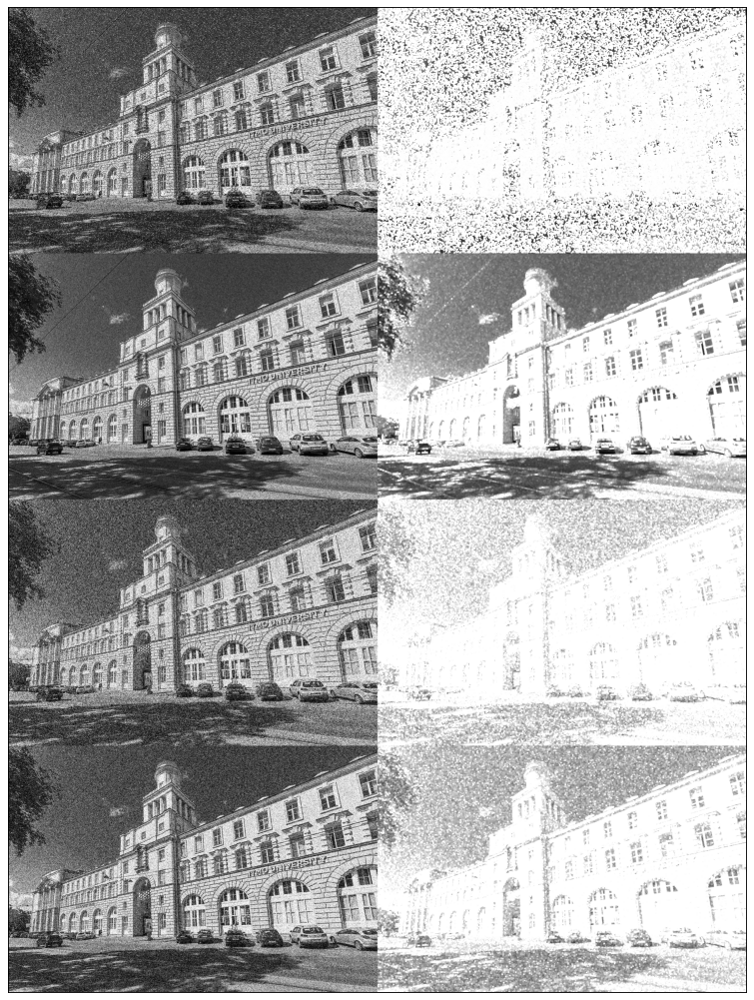

In [ ]:
rank = -1
kernel = np.ones((5,5),np.float64)
print(f"rank = {rank + 25}")
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = scipy.ndimage.rank_filter(images_noised[image_name], footprint=kernel, rank=rank)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 3.4 Фильтр Винера

Также добавлено адаптивное автоисправление гистограммы CLAHE

[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
salt and pepper, speckle, gaussian, poisson, 


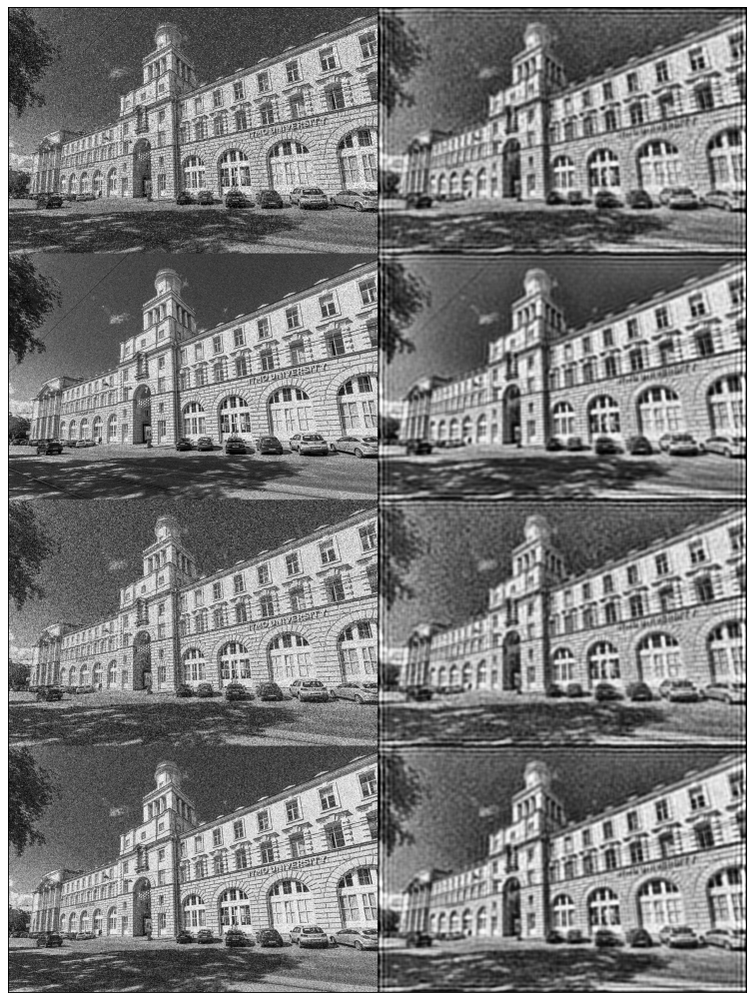

In [ ]:
kernel = np.ones((15,15),np.float64)
print(kernel)

image_combined = None
for image_name in images_noised.keys():
    print(image_name, end=', ')
    image_filtered = skimage.img_as_float64(images_noised[image_name])
    image_filtered = scipy.signal.convolve2d(image_filtered, kernel, 'same')
    image_filtered = skimage.restoration.wiener(image_filtered, kernel, 5.1e4)
    image_filtered = skimage.img_as_ubyte(image_filtered)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8,8))
    image_filtered = clahe.apply(image_filtered)
    image_filtered = cv2.hconcat([images_noised[image_name], image_filtered])
    if image_combined is None:
        image_combined = image_filtered
    else:
        image_combined = cv2.vconcat([image_combined, image_filtered])
print()
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_combined, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]


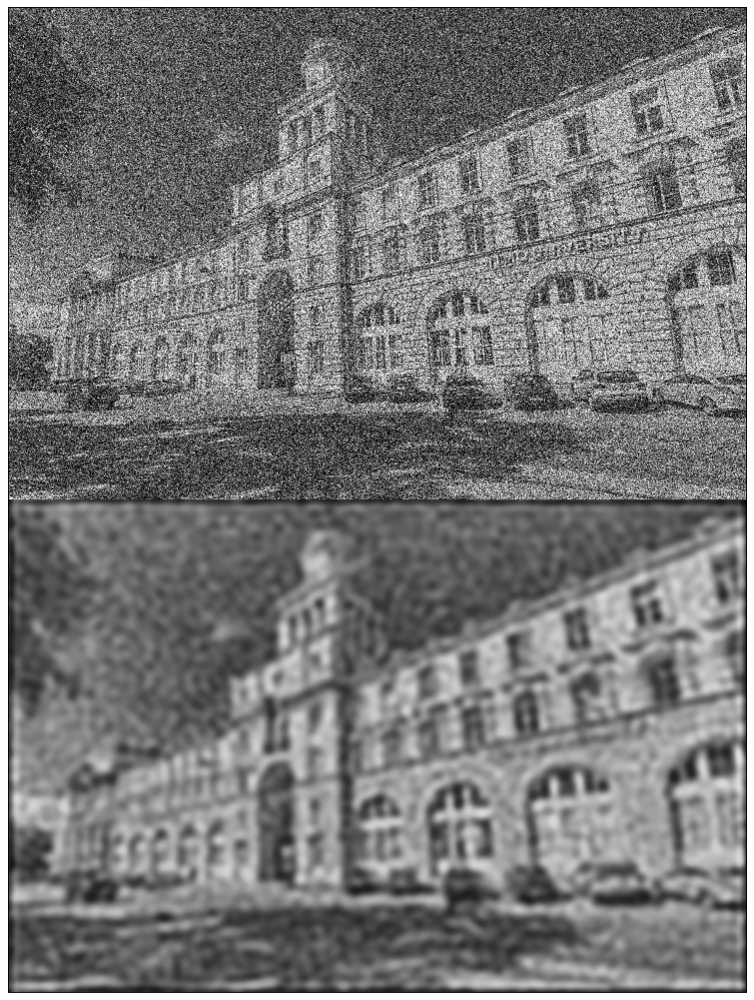

In [ ]:
kernel = np.ones((15,15),np.float64)
print(kernel)

image_filtered = skimage.img_as_float64(image_noised_all)
image_filtered = scipy.signal.convolve2d(image_filtered, kernel, 'same')
image_filtered = skimage.restoration.wiener(image_filtered, kernel, 1.3e6)
image_filtered = skimage.img_as_ubyte(image_filtered)
clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8,8))
image_filtered = clahe.apply(image_filtered)
image_filtered = cv2.vconcat([image_noised_all, image_filtered])
figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()